<center>
<img src='images/covid19.png' align='center' width="1000x">
</center>

# Андан на экономе

## Семинар 5: Визуализация ковида

Визуализация занимает важную часть в анализе данных. Представляя информацию в графическом виде, вы облегчаете процесс ее восприятия, что дает возможность выделять дополнительные закономерности, оценивать соотношения величин, быстрее доносить ключевые аспекты в данных. 

Начнем с небольшой "памятки", о которой всегда нужно помнить при создании любых графиков. 

### <center> Как визуализировать данные и заставить всех тебя ненавидеть </center>

1. Заголовок графика для слабаков. По графику всегда понятно, какие данные и явления он описывает.
2. Ни в коем случае не подписывай ни одной оси у графика. Пусть смотрящий развивает свою интуицую! 
3. Единицы измерения совсем не обязательны. Какая разница, в чем измеряли количество — в людях или в литрах!
4. Чем меньше шрифт на графике, тем острее зрение смотрящего. 
5. На одном графике нужно стараться уместить всю информацию, которая у тебя есть в датасете. С полными названиями, расшифровками, сносками. Чем больше текста — тем информативнее!
6. При любой возможности используйте 3D и спецэффекты, пусть знают, что ты — прирожденный дизайнер. К тому же, так будет меньше визуальных искажений. 

В качестве примера, рассмотрим кейс с пандемией. Воспользуемся датасетом со статистикой по коронавирусу (COVID-19), который выложен [в открытом доступе на Kaggle](https://www.kaggle.com/c/covid19-global-forecasting-week-4/)

Ну а если серьёзно, посмотрите: 

- [Правила хорошей визуализации от Хиндмана](https://robjhyndman.com/hyndsight/graphics/) **[en]**
- [Почему визуализация важна aka проект про динозавров](https://www.autodesk.com/research/publications/same-stats-different-graphs) **[en]**
* __Remove to improve: удаляем с визуализаций лишние элементы и делаем их лучше [en]:__ 
  * [Столбчатые диаграммы](https://www.darkhorseanalytics.com/portfolio/data-looks-better-naked-bar-charts)
  * [Таблицы](https://www.darkhorseanalytics.com/portfolio/2016/1/7/data-looks-better-naked-clear-off-the-table)
  * [Геоданные](https://www.darkhorseanalytics.com/portfolio/w24s5qofnzm4wqmsdfq98kwx035tew)
  * [Круговые диаграммы (смотреть до конца)](https://www.darkhorseanalytics.com/portfolio/2016/1/7/data-looks-better-naked-pie-charts) - благородные Леди и Джентельмены используют круговые диаграммы только [под угрозой расстрела](https://www.biostat.wisc.edu/~kbroman/presentations/IowaState2013/graphs_combined.pdf)


- [Примеры плохих визуализаций,](https://viz.wtf) ещё [примеры плохих визуализаций](https://badvisualisations.tumblr.com/), [ещё примеры плохого](https://www.biostat.wisc.edu/~kbroman/presentations/IowaState2013/graphs_combined.pdf) **[en]**
- [Примеры хороших визуализаций](https://www.reddit.com/r/dataisbeautiful/) **[en]**
- Статьи про визуализацию в блоге Александра Дьяконова: [нулевая,](https://dyakonov.org/2017/10/06/визуализация-часть-0/) [первая](https://dyakonov.org/2017/10/30/визуализация-часть-1/) и [вторая](https://dyakonov.org/2016/11/08/визуализации) **[ru]**

Основные библиотеки для визуализации в Python, которые нам сегодня понадобятся — это **matplotlib, seaborn, plotly**. 

In [1]:
# Установим вспомогательные пакеты
# !pip3 install plotly
# !pip3 install plotly-express
# !pip3 install nbformat>=4.2.0

In [2]:
import pandas as pd
import numpy as np
import pickle

# Модули для визуализации
import matplotlib.pyplot as plt
import seaborn as sns

import plotly
import plotly_express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

%config InlineBackend.figure_format = 'svg' # Графики в svg выглядят четче

# Увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 7, 5

import warnings
warnings.filterwarnings('ignore')

Считаем данные и посмотрим количество стран в датасете и какие дни он покрывает. 

In [3]:
data = pd.read_csv('data/train.csv')

print("Количество стран: ", data['Country_Region'].nunique())
print("Дни с {} по {}, всего {} дней.".format(min(data['Date']), 
                                          max(data['Date']), 
                                          data['Date'].nunique()))

# Поменяем формат даты из str в pd.Timestamp 
data['Date'] = pd.to_datetime(data['Date'], format = '%Y-%m-%d')

# Выведем последнюю статистику по России 
display(data[data.Country_Region == 'Russia'].tail())

Количество стран:  184
Дни с 2020-01-22 по 2020-05-15, всего 115 дней.


,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
23570,23571,NaN,Russia,2020-05-11,221344.0,2009.0
23571,23572,NaN,Russia,2020-05-12,232243.0,2116.0
23572,23573,NaN,Russia,2020-05-13,242271.0,2212.0
23573,23574,NaN,Russia,2020-05-14,252245.0,2305.0
23574,23575,NaN,Russia,2020-05-15,262843.0,2418.0


Давайте построим график по общему числу заразившихся и погибших. Возьмем колонки `ConfirmedCases` и `Fatalities`.

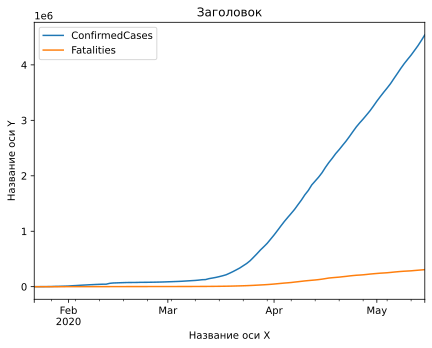

In [4]:
ax = data[['ConfirmedCases', 'Fatalities', 'Date']].groupby('Date').sum().plot(title='Заголовок')

ax.set_xlabel("Название оси X")
ax.set_ylabel("Название оси Y"); # символ ';' прячет первую строку Text из графика

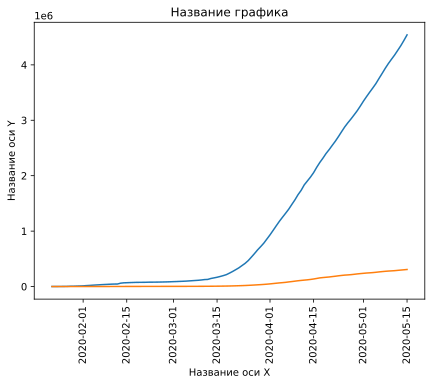

In [5]:
# Код для аналогичного Line chart на matplotlib
plt.plot(data[['ConfirmedCases', 'Fatalities', 'Date']].groupby('Date').sum())
plt.title('Название графика')
plt.xlabel('Название оси X')
plt.ylabel('Название оси Y')
plt.xticks(rotation=90)
plt.show()

График выше показывает нам общую информацию по всему миру. Давайте выделим 10 наиболее пострадавших стран (по итогам последнего дня из датасета) и на одном графике покажем данные по каждой из них по числу зарегистрированных случаев болезни. В этот раз, попробуем воспользоваться библиотекой **plotly**. 

In [6]:
# Выделим топ-10 стран по количеству подтвержденных случаев 
df_top = data[data['Date'] == max(data.Date)]
df_top = df_top.groupby('Country_Region', as_index=False)['ConfirmedCases'].sum()
df_top = df_top.nlargest(10,'ConfirmedCases')

# Выделим тренд с учетом времени
df_trend = data.groupby(['Date','Country_Region'], as_index=False)['ConfirmedCases'].sum()
df_trend = df_trend.merge(df_top, on='Country_Region')
df_trend.rename(columns={'Country_Region' : 'Countries', 
                         'ConfirmedCases_x':'Cases',
                         'Date' : 'Dates'}, 
                inplace=True)

# px - это сокращения заимпортированного plotly_express
px.line(df_trend, 
        title='Рост числа выявленных случаев COVID-19',
        x='Dates', 
        y='Cases', 
        color='Countries')

Попробуем прологарифмировать признак количества выявленных случаев и построить график еще раз. 

In [7]:
# Добавим столбец для визуализации логарифмического 
df_trend['ln(Cases)'] = np.log(df_trend['Cases'] + 1) # Добавляем 1 для случая log(0)

px.line(df_trend, 
        x='Dates', 
        y='ln(Cases)', 
        color='Countries', 
        title='COVID19 Total Cases growth for top 10 worst affected countries(Logarithmic Scale)')

У большиснтва стран количество заболевших монотонно возрастает, но в случае с Китаем уже наблюдается затухание. 

> Какие интересные выводы вы можете сделать по этому графику?

Попробуйте сделать аналогичные графики по количеству погибших от COVID-19 (по переменной **Fatalities** вместо **ConfirmedCases**). 

In [8]:
# TODO

На линейных графиках выше мы визуализировали совокупную информацию по странам по количеству выявленных заболевших. Теперь, давайте попробуем построить график по дневному тренду, посчитав разницу между текущим значением и значением предыдущего дня. Для этой цели, воспользуемся гистограммой. Также, добавим указатели по ключевым событиям, например, даты локдаунов в провинции Ухань в Китае, Италии и Великобритании. 

In [9]:
df_world = data.groupby('Date', as_index=False)['Fatalities', 'ConfirmedCases'].sum()

df_world['Cases_daily'] = df_world['ConfirmedCases'].diff()
df_world['Deaths_daily'] = df_world['Fatalities'].diff()

df_world.head()

,Date,Fatalities,ConfirmedCases,Cases_daily,Deaths_daily
0,2020-01-22,17.0,554.0,NaN,NaN
1,2020-01-23,18.0,653.0,99.0,1.0
2,2020-01-24,26.0,939.0,286.0,8.0
3,2020-01-25,42.0,1432.0,493.0,16.0
4,2020-01-26,56.0,2113.0,681.0,14.0


In [10]:
fig = go.Figure(data=[
    go.Bar(name='Количество заболевших',
           marker={'color': 'rgb(0,100,153)'},
           x=df_world.Date, 
           y=df_world.Cases_daily),
    go.Bar(name='Количество смертей', x=df_world.Date, y=df_world.Deaths_daily)
])

fig.update_layout(barmode='overlay', title='Статистика по числу заражений и летальных исходов от COVID-19 в мире',
                 annotations=[dict(x='2020-01-23', y=1797, text="Lockdown (Ухань)", 
                                   showarrow=True, arrowhead=1, ax=-100, ay=-200),
                              dict(x='2020-03-09', y=1797, text="Lockdown (Италия)", 
                                   showarrow=True, arrowhead=1, ax=-100, ay=-200),
                              dict(x='2020-03-23', y=19000, text="Lockdown (Великобритания)", 
                                   showarrow=True, arrowhead=1, ax=-100, ay=-200)])
fig.show()

In [11]:
# Можно сохранить график в статичном виде на компьютер
plotly.offline.plot(fig, filename='my_beautiful_histogram.html', show_link=False)

'my_beautiful_histogram.html'

Гистограмму часто путают со столбчатой диаграммой (Bar Chart) из-за визуального сходства, однако у этих графиков разные цели. Гиcтограмма пoказывает, как распределены данные в рамках непрерывного интервала или определенного периода времени. По вертикальной оси гистограммы находится частотность, по горизонтальной — интервалы или какой-то временной период.

Давайте теперь построим столбчатую диаграмму. Она бывает вертикальный и горизонтальный, выберем второй вариант. 
Построим график только для топ-20 стран по смертности. Будем рассчитывать эту статистику как отношение количества смертей к количеству подтвержденных заболевших по каждой стране. 

По некоторым странам в датасете статистика представлена по каждому региону (например, по всем штатам США). Для таких стран оставим только одно (максимальное) значение. Как вариант, можно было бы посчитать среднее по регионам и оставить его как показатель по стране.  

In [12]:
df_mortality = data.query('(Date == "2020-04-17") & (ConfirmedCases > 100)') 
df_mortality['mortality'] = df_mortality['Fatalities'] / df_mortality['ConfirmedCases']
df_mortality['mortality'] = df_mortality['mortality'].apply(lambda x: round(x, 3))
df_mortality.sort_values('mortality', ascending=False, inplace=True)

# Оставим только максимальное значение смертности для стран, у которых статистика предоставлена по каждому региону
df_mortality.drop_duplicates(subset=['Country_Region'], keep='first', inplace=True)

In [13]:
fig = px.bar(df_mortality[:20].iloc[::-1],
             x='mortality', 
             y='Country_Region',
             labels={'mortality': 'Уровень смертности', 'Country_Region': 'Страна'},
             title=f'Уровень смертности: топ-20 стран по состоянию на 2020-04-17', 
             text='mortality', 
             height=800, 
             orientation='h',
             color = 'mortality'
) 

fig.show()

**Heat Maps** (тепловые карты) достаточно полезно использовать для дополнительная визуализации матриц корреляций между признаками. Когда признаков очень много, с помощью такого графика вы быстрее сможете оценить, какие признаки сильно скоррелировано или не обладают линейной взаимосвязью. 

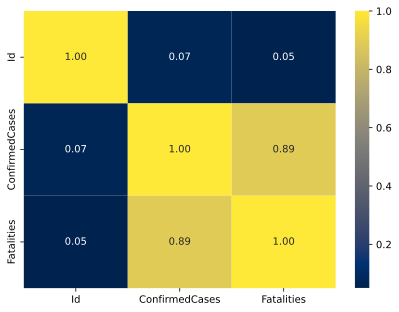

In [14]:
# Тепловая карта (используя seaborn) 
sns.heatmap(data.corr(), annot=True, fmt='.2f', cmap='cividis'); # попробуйте другой цвет, например, 'RdBu'

График рассеяния помогает найти взаимосвязь между двумя показателями. Для этого, можно воспользоваться pairplot, который сразу выведет гистограмму по каждой переменной и диаграмму рассеяния по двум переменным (по разным осям графика). 

In [15]:
# чтобы компьютер не умер при строительстве такого графика, делайте .sample

sns_plot = sns.pairplot(data[['Fatalities', 'ConfirmedCases']].sample(1000))
sns_plot.savefig('pairplot.png') # сохранение картинки

При анализе данных, часто используют сводные таблицы. Сводная таблица (**Pivot table**) может автоматически сортировать, рассчитывать суммы или получить среднее значение из данных.

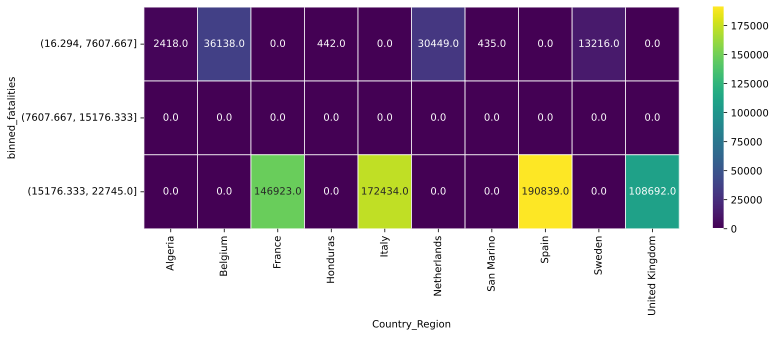

In [17]:
plt.figure(figsize=(12, 4))

df_new = df_mortality.iloc[:10]
df_new['ConfirmedCases'] = df_new['ConfirmedCases'].astype(np.int)
df_new['binned_fatalities'] = pd.cut(df_new['Fatalities'], 3)

platform_genre_sales = df_new.pivot_table(
                        index='binned_fatalities', 
                        columns='Country_Region', 
                        values='ConfirmedCases', 
                        aggfunc=sum).fillna(int(0)).applymap(np.int)

sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=0.7, cmap="viridis");

Фоновая картограмма (choropleth map) как раз нужна для таких данных,которые необходимо показать по странам или регионам. Дополнительно, можно использовать временную ось, чтобы рассмотреть изменение показателей в динамике. 

In [20]:
# В этом файле лежит словарь с аббревиатурами для стран
with open('data/countries_codes.pkl', 'rb') as file:
    countries_codes = pickle.load(file)

In [21]:
df_map = data.copy()
df_map['Date'] = data['Date'].astype(str)
df_map = df_map.groupby(['Date','Country_Region'], as_index=False)['ConfirmedCases','Fatalities'].sum()
df_map['iso_alpha'] = df_map['Country_Region'].map(countries_codes)
df_map['ln(ConfirmedCases)'] = np.log(df_map.ConfirmedCases + 1)
df_map['ln(Fatalities)'] = np.log(df_map.Fatalities + 1)

In [22]:
px.choropleth(df_map, 
              locations="iso_alpha", 
              color="ln(ConfirmedCases)", 
              hover_name="Country_Region",
              hover_data=["ConfirmedCases"],
              animation_frame="Date",
              color_continuous_scale=px.colors.sequential.OrRd,
              title = 'Total Confirmed Cases growth (Logarithmic Scale)')

Какую важную информацию дал новый график (визуализация по времени и геолокации)? Можно ли по графику ответить на вопросы:
* С какой страны началось распространение коронавируса?
* Какие страны наиболее пострадали от пандемии?
* На какую часть полушария приходится большинство случаев заболевания? Какие можно сформулировать гипотезы относительно температуры и скорости распространения вируса?

Какие еще наблюдения вы можете сделать из графика? 

Визуализация карты получилась довольно всратой. Если хотите визуализировать карты, используйте другие библиотеки, например `folium`.

In [24]:
# !pip3 install folium

In [25]:
import folium
m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)
m

Больше материалов по визуализации ищи [в README к семинару.](https://github.com/hse-econ-data-science/andan_2023/tree/main/sem03_eda)